In [30]:
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)


cuda:0


In [31]:
!pip uninstall -q tensorboard tb-nightly 


Proceed (y/n)? y


In [32]:
!pip install -q tb-nightly

In [33]:
from torch.utils import tensorboard
%pylab inline
%load_ext tensorboard



Populating the interactive namespace from numpy and matplotlib
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


/usr/local/lib/python3.7/dist-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['imshow']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [34]:
from torch.serialization import mkdtemp
import tempfile
log_dir = tempfile.mkdtemp()

%tensorboard --logdir {log_dir} --reload_interval 1

<IPython.core.display.Javascript object>

In [35]:

import torchvision
from torch import nn
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
# from torchinfo import summary
from torch.utils import data
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import matplotlib.pyplot as plt


writer = SummaryWriter(log_dir, flush_secs= 1)




In [36]:

# Setup ImageNet normalization levels (turns all images into similar distribution as ImageNet)
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Create starter transform
train_transform = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.CenterCrop(10),
    transforms.Grayscale(3),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=90),
    
    transforms.ToTensor(),
    normalize
])

test_transform = transforms.Compose([transforms.Resize((32, 32)),
    transforms.ToTensor(),
    normalize
])           

# Create datasets

train_dataset =  torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download= True, transform=train_transform)


Files already downloaded and verified


In [37]:
train_dataset

Dataset CIFAR10
    Number of datapoints: 50000
    Root location: ./data
    Split: Train
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=None)
               CenterCrop(size=(10, 10))
               Grayscale(num_output_channels=3)
               RandomHorizontalFlip(p=0.5)
               RandomRotation(degrees=[-90.0, 90.0], interpolation=nearest, expand=False, fill=0)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [38]:
test_dataset = testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform= test_transform)

Files already downloaded and verified


In [39]:
test_dataset

Dataset CIFAR10
    Number of datapoints: 10000
    Root location: ./data
    Split: Test
    StandardTransform
Transform: Compose(
               Resize(size=(32, 32), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )

In [40]:
train_dataloader = DataLoader(train_dataset, batch_size=1000, shuffle=True, num_workers= 4)
test_dataloader = DataLoader(test_dataset, batch_size=1000, shuffle=False , num_workers=4)
classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [41]:
from torch import conv2d, max_pool2d
from torch.nn import Dropout, Linear
from torch.nn.modules import MaxPool2d, ReLU, linear, padding
from torch.nn.modules.pooling import MaxPool3d





In [42]:
class ResBottleneckBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample):
        super().__init__()
        self.downsample = downsample
        self.conv1 = nn.Conv2d(in_channels, out_channels//4,
                               kernel_size=1, stride=1)
        self.conv2 = nn.Conv2d( 
            out_channels//4, out_channels//4, kernel_size=3, stride=2 if downsample else 1, padding=1)
        self.conv3 = nn.Conv2d(out_channels//4, out_channels, kernel_size=1, stride=1)

        if self.downsample or in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1,
                          stride=2 if self.downsample else 1),
                nn.BatchNorm2d(out_channels)
            )
        else:
            self.shortcut = nn.Sequential()

        self.bn1 = nn.BatchNorm2d(out_channels//4)
        self.bn2 = nn.BatchNorm2d(out_channels//4)
        self.bn3 = nn.BatchNorm2d(out_channels)

    def forward(self, input):
        shortcut = self.shortcut(input)
        input = nn.ReLU()(self.bn1(self.conv1(input)))
        input = nn.ReLU()(self.bn2(self.conv2(input)))
        input = nn.ReLU()(self.bn3(self.conv3(input)))
        input = input + shortcut
        return nn.ReLU()(input)

In [43]:
class ResNet(nn.Module):
    def __init__(self, in_channels, resblock, repeat, useBottleneck= True, outputs=1000):
        super().__init__()
        self.layer0 = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=7, stride=2, padding=3),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU()
        )

        if useBottleneck:
            filters = [32,32, 64, 128, 256,512]

    

        self.layer1 = nn.Sequential()
        self.layer1.add_module('conv2_1', resblock(filters[0], filters[1], downsample=False))
        for i in range(1, repeat[0]):
                self.layer1.add_module('conv2_%d'%(i+1,), resblock(filters[1], filters[1], downsample=False))

        self.layer2 = nn.Sequential()
        self.layer2.add_module('conv3_1', resblock(filters[1], filters[2], downsample=True))
        for i in range(1, repeat[1]):
                self.layer2.add_module('conv3_%d' % (
                    i+1,), resblock(filters[2], filters[2], downsample=False))

        self.layer3 = nn.Sequential()
        self.layer3.add_module('conv4_1', resblock(filters[2], filters[3], downsample=True))
        for i in range(1, repeat[2]):
            self.layer3.add_module('conv2_%d' % (
                i+1,), resblock(filters[3], filters[3], downsample=False))

        self.layer4 = nn.Sequential()
        self.layer4.add_module('conv5_1', resblock(filters[3], filters[4], downsample=True))
        for i in range(1, repeat[3]):
            self.layer4.add_module('conv3_%d'%(i+1,),resblock(filters[4], filters[4], downsample=False))

        self.layer5 = nn.Sequential()
        self.layer5.add_module('conv5_1', resblock(filters[4], filters[5], downsample=True))
        for i in range(1, repeat[4]):
            self.layer5.add_module('conv3_%d'%(i+1,),resblock(filters[5], filters[5], downsample=False))


        self.gap = torch.nn.AdaptiveAvgPool2d(1)
        self.fc = torch.nn.Linear(filters[5], outputs)

    def forward(self, input):
        input = self.layer0(input)
        input = self.layer1(input)
        input = self.layer2(input)
        input = self.layer3(input)
        input = self.layer4(input)
        input = self.layer5(input)

        input = self.gap(input)
        
        input = torch.flatten(input, start_dim=1)
        input = self.fc(input)

        return input

In [44]:
model = ResNet(3, ResBottleneckBlock, [
                  3, 4, 6, 4,3], useBottleneck=True, outputs=1000)

In [45]:
import torch.optim as optim

In [46]:
torch.manual_seed(99)

optimizer = optim.Adam(model.parameters(), lr = 0.01)
criterion = nn.CrossEntropyLoss()

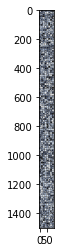

  cat   cat  deer  deer


In [47]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

#Get some random training images
dataiter = iter(train_dataloader)
images, labels = dataiter.next()
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))


In [48]:
def matplotlib_imshow(img, one_channel=False):
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

In [49]:
def images_to_probs(net, images):
    '''
    Generates predictions and corresponding probabilities from a trained
    network and a list of images
    '''
    output = net(images)
    # convert output probabilities to predicted class
    _, preds_tensor = torch.max(output, 1)
    preds = np.squeeze(preds_tensor.numpy())
    return preds, [F.softmax(el, dim=0)[i].item() for i, el in zip(preds, output)]


def plot_classes_preds(net, images, labels):
    '''Generates matplotlib Figure using a trained network, along with images and labels from a batch'''
    preds, probs = images_to_probs(net, images)
    # plot the images in the batch, along with predicted and true labels
    fig = plt.figure(figsize=(12, 48))
    for idx in np.arange(4):
        ax = fig.add_subplot(1, 4, idx+1, xticks=[], yticks=[])
        matplotlib_imshow(images[idx],one_channel= True)
        ax.set_title("{0}, {1:.1f}%\n(label: {2})".format(
            classes[preds[idx]],
            probs[idx] * 100.0,
            classes[labels[idx]]),
                    color=("green" if preds[idx]==labels[idx].item() else "red"))
    return fig

In [50]:
def get_accuracy(predictions, Y):
    # predictions,Y = predictions.detach().np(), Y.detach().np()
    
    k = torch.sum(predictions - Y) / len(Y)
    return k



def plot_losses(Y_hat, Y):
    m = np.shape(Y_hat)[1]
    cost = -1 / m * (np.dot(Y, np.log(Y_hat).T) + np.dot(1 - Y, np.log(1 - Y_hat).T))
    return np.squeeze(cost)

In [51]:
def train(train_loader, model, criterion, optimizer ):
    '''
    Function for the training step of the training loop
    '''

    model.train()
    running_loss = 0
    train_acc = 0
    
    for X, y_true in train_loader:

        optimizer.zero_grad()
        
        X = X
        y_true = y_true

        
    
        # Forward pass
        y_hat = model(X) 
        

        loss = criterion(y_hat, y_true) 
        acc = get_accuracy(y_true,y_hat)
        train_acc += acc
        running_loss += loss.item() 

        

        # Backward pass
        loss.backward()
        optimizer.step()
        
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc =  train_acc/ len(train_loader.dataset)
    return model, optimizer, epoch_loss, epoch_acc

In [52]:
def validate(valid_loader, model, criterion):
    '''
    Function for the validation step of the training loop
    '''
   
    model.eval()
    running_loss = 0
    test_acc = 0
   
    
    for X, y_true in valid_loader:
    
        X = X
        y_true = y_true

        # Forward pass and record loss
        y_hat = model(X)
        loss = criterion(y_hat, y_true) 
        acc = get_accuracy(y_true,y_hat)
        test_acc += acc

        running_loss += loss.item() * X.size(0)

    epoch_loss = running_loss / len(valid_loader.dataset)
    epoch_acc = test_acc / len(valid_loader.dataset)
        
    return model, epoch_loss, epoch_acc

In [53]:
def training_loop(model, criterion, optimizer, train_loader, valid_loader, epochs, print_every=1):
    '''
    Function defining the entire training loop
    '''
    
    # set objects for storing metrics
    best_loss = 1e10
    train_losses = []
    valid_losses = []
    train_accuracy = []
    val_accuracy = []
 
    # Train model
    for epoch in range(0, epochs):

        # training
        model, optimizer, train_loss,train_acc = train(train_loader, model, criterion, optimizer)
        train_losses.append(train_loss)

        writer.add_scalar('training loss',
                            train_loss / 1000,
                            epoch * len(train_loader))

#             # ...log a Matplotlib Figure showing the model's predictions on a
# #             # random mini-batch
#         writer.add_figure('predictions vs. actuals',
#                     plot_classes_preds(model, inputs, labels),
#                     global_step=epoch * len(trainloader) + i)

        # validation
        with torch.no_grad():
            model, valid_loss,valid_acc = validate(valid_loader, model, criterion)
            valid_losses.append(valid_loss)

            
        writer.add_scalar('validation_loss',
                            valid_loss / 1000,
                            epoch * len(train_loader))
        
        # m = torch.Tensor(m)
        # n = torch.Tensor(n)

        # train_acc = get_accuracy(m, n)

        writer.add_scalar('training accuracy',
                          train_acc,
                          epoch * len(train_loader))
        
        # p = torch.Tensor(p)
        # q = torch.Tensor(q)

        # valid_acc = get_accuracy(p, q)

        writer.add_scalar('validation accuracy',
                          valid_acc,
                          epoch * len(train_loader))



       
            
       

        if epoch % print_every == (print_every - 1):
                
            print(
                  f'Epoch: {epoch}\t'
                  f'Train loss: {train_loss:.4f}\t'
                  f'Valid loss: {valid_loss:.4f}\t'
                  f'Train accuracy: {train_acc:.2f}%\t'
                  f'Valid accuracy: {valid_acc:.2f}%')

    
    return model, optimizer, (train_losses, valid_losses)

In [54]:
model, optimizer, _ = training_loop(model, criterion, optimizer, train_dataloader, test_dataloader, 15)

Epoch: 0	Train loss: 0.0027	Valid loss: 651.1888	Train accuracy: 15.63%	Valid accuracy: 30840.61%
Epoch: 1	Train loss: 0.0024	Valid loss: 4.0613	Train accuracy: 13.77%	Valid accuracy: 52.12%
Epoch: 2	Train loss: 0.0024	Valid loss: 12.6470	Train accuracy: 13.53%	Valid accuracy: 324.86%
Epoch: 3	Train loss: 0.0023	Valid loss: 101.4390	Train accuracy: 12.98%	Valid accuracy: 1365.90%
Epoch: 4	Train loss: 0.0023	Valid loss: 4.2481	Train accuracy: 12.57%	Valid accuracy: 63.24%
Epoch: 5	Train loss: 0.0023	Valid loss: 4.0152	Train accuracy: 12.20%	Valid accuracy: 77.48%
Epoch: 6	Train loss: 0.0023	Valid loss: 5.0349	Train accuracy: 12.01%	Valid accuracy: 75.56%
Epoch: 7	Train loss: 0.0022	Valid loss: 2.4892	Train accuracy: 11.97%	Valid accuracy: 15.30%
Epoch: 8	Train loss: 0.0022	Valid loss: 4.5583	Train accuracy: 12.25%	Valid accuracy: 53.49%
Epoch: 9	Train loss: 0.0022	Valid loss: 5.1177	Train accuracy: 12.14%	Valid accuracy: 88.82%
Epoch: 10	Train loss: 0.0022	Valid loss: 3.9176	Train accur

In [55]:
from torchvision.transforms import ToTensor

In [56]:
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix


In [57]:
def plotcm(testloader,net,classes):
    y_pred = []
    y_true = []

# iterate over test data
    for inputs, labels in testloader:
            output = net(inputs) # Feed Network

            output = (torch.max(torch.exp(output), 1)[1]).data.cpu().numpy()
            y_pred.extend(output) # Save Prediction
            
            labels = labels.data.cpu().numpy()
            y_true.extend(labels) # Save Truth

    # constant for classes
   

    # Build confusion matrix
    cf_matrix = confusion_matrix(y_true, y_pred)
    df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *10, index = [i for i in classes],
                        columns = [i for i in classes])
    plt.figure(figsize = (12,7))
    sns.heatmap(df_cm, annot=True)
    plt.savefig('output.png')


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


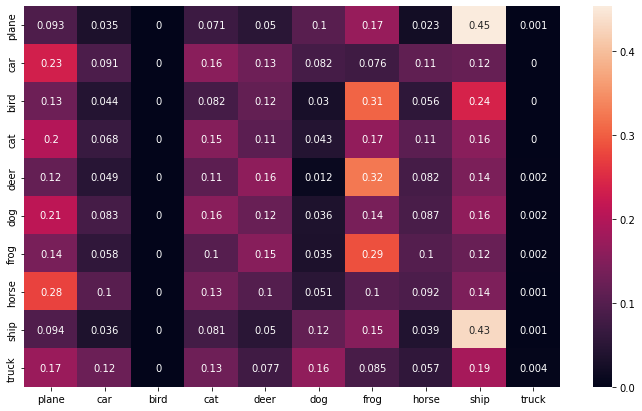

In [59]:
plotcm(test_dataloader,model,classes)

In [64]:

class_probs = []
class_label = []
with torch.no_grad():
    for data in test_dataloader:
        images, labels = data
        output = model(images)
        class_probs_batch = [F.softmax(el, dim=0) for el in output]

        class_probs.append(class_probs_batch)
        class_label.append(labels)

test_probs = torch.cat([torch.stack(batch) for batch in class_probs])
test_label = torch.cat(class_label)


def add_pr_curve_tensorboard(class_index, test_probs, test_label, global_step=0):
    '''
    Takes in a "class_index" from 0 to 9 and plots the corresponding
    precision-recall curve
    '''
    tensorboard_truth = test_label == class_index
    tensorboard_probs = test_probs[:, class_index]

    writer.add_pr_curve(classes[class_index],
                        tensorboard_truth,
                        tensorboard_probs,
                        global_step=global_step)
    writer.close()

# plot all the pr curves
for i in range(len(classes)):
    add_pr_curve_tensorboard(i, test_probs, test_label)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Text(0.5, 0.98, 'ResNet - predictions')

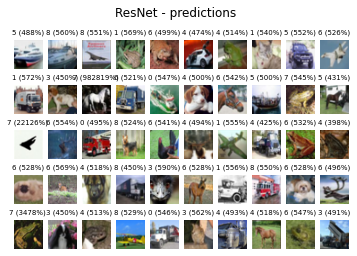

In [65]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure()
for index in range(1, ROW_IMG * N_ROWS + 1):
    plt.subplot(N_ROWS, ROW_IMG, index)
    plt.axis('off')
    plt.imshow(test_dataset.data[index], cmap='gray_r')
    
    with torch.no_grad():
        model.eval()
        probs = model(test_dataset[index][0].unsqueeze(0))
        
    title = f'{torch.argmax(probs)} ({torch.max(probs * 100):.0f}%)'
    
    plt.title(title, fontsize=7)
fig.suptitle('ResNet - predictions')